In [1]:
# Numerical libs
import numpy as np
import pandas as pd

# ML libs
import cv2

# Plotting libs
import matplotlib.pyplot as plt
import seaborn as sns
# Utils
import os


## Utils

In [2]:
def load_images_from_folder(folder, size = (256, 256), start = 0, end = 100000):
    images = []
    for filename in os.listdir(folder)[start:end]:
        img = cv2.imread(os.path.join(folder,filename))
        if img is not None:
            img = cv2.resize(img, dsize = size)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            images.append(img)
    return np.array(images)

In [3]:
def save_images_in_folder(folder, images, size = (256, 256), start_index = 0):
    for i, img in enumerate(images):
        img = cv2.resize(img, dsize = size)
        img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)
        cv2.imwrite(os.path.join(folder, str(start_index + i) + '.png'), img)
        #Image.fromarray(image).save(os.path.join(dir_aug, str(start_index + i) + '.png'))

## Read an image

In [7]:
img = cv2.imread("datasets/money/1/4.jpg")
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # cv2 defaults to bgr order
img = cv2.resize(img, dsize = (1024, 1024), interpolation = cv2.INTER_AREA) 

In [8]:
img.shape

(1024, 1024, 3)

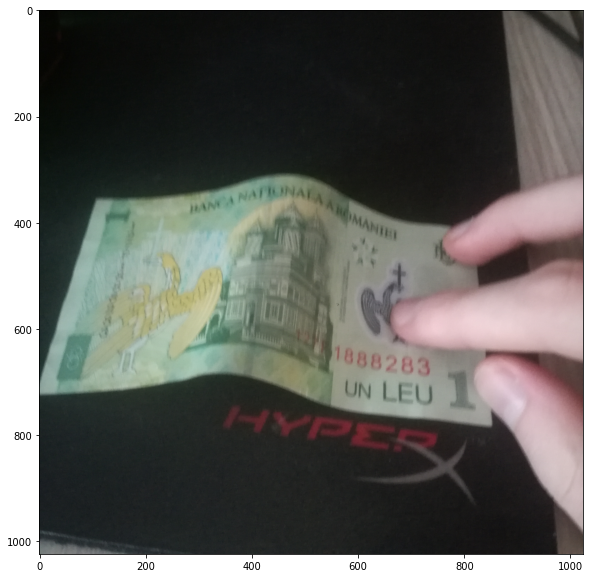

In [10]:
plt.figure(figsize=(10, 10))
plt.imshow(img)
plt.show()

# Data augumentation

- https://www.youtube.com/watch?v=rfM4DaLTkMs - explanation
- https://towardsdatascience.com/data-augmentation-compilation-with-python-and-opencv-a5a98a6906aa - opencv examples

> Data augmentation in data analysis are techniques used to increase the amount of data by adding slightly modified copies of already existing data or newly created synthetic data from existing data. 

# Image Augumentation - OpenCV

**How to augument images?**

**Geometric transformation**
- flipping, shifting, shearing, rotation
- color modification (brightness, channel mingleing)
- cropping
- noise injection 
- random erasing 

**Synthetic data**
- Generate new images (Example: GANs)

## Geometric transformations

### Resize

In [11]:
#https://www.tutorialkart.com/opencv/python/opencv-python-resize-image/
# cv2.INTER_AREA - for shrinking
# cv2.INTER_LINEAR - for zooming

img_downscaled = cv2.resize(img, dsize = (128, 128), interpolation = cv2.INTER_AREA) 

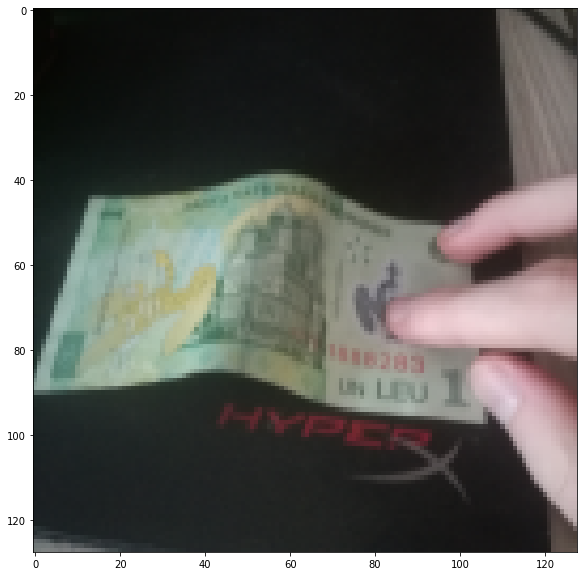

In [12]:
plt.figure(figsize=(10, 10))
plt.imshow(img_downscaled)
plt.show()

### Flip, shift,  rotation

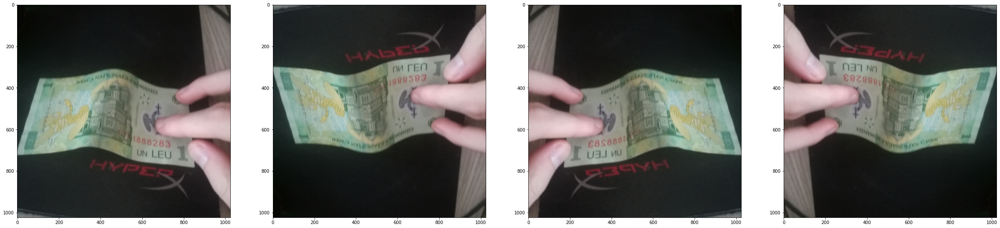

In [13]:
# Flip

fig, axs = plt.subplots(1, 4, figsize = (40, 10))

axs[0].imshow(img)

img_flip = cv2.flip(img, flipCode = 0) # flip along the x axis
axs[1].imshow(img_flip)

img_flip = cv2.flip(img, flipCode = 1) # flip along the y axis
axs[2].imshow(img_flip)

img_flip = cv2.flip(img, flipCode = -1) # both axis
axs[3].imshow(img_flip)

plt.show()

In [14]:
?cv2.warpAffine

For shifting we use the `cv2.warpAffine` function that takes a matrix of form
$$M = \begin{bmatrix} 
1 & 0 & t_x \\ 
0 & 1 & t_y
\end{bmatrix}$$

In [15]:
# Shift image
# https://www.pyimagesearch.com/2021/02/03/opencv-image-translation/
M = np.float32([
    [1, 0, 200],
    [0, 1, 500]
])

img_shift = cv2.warpAffine(img, M, (img.shape[0],img.shape[1]))

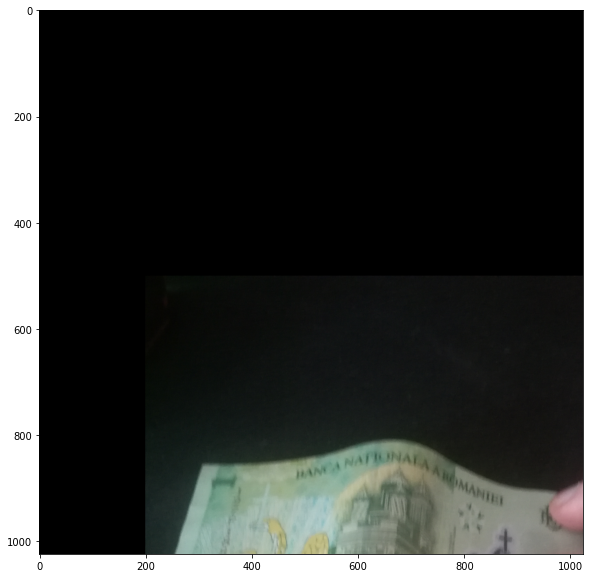

In [16]:
plt.figure(figsize=(10, 10))
plt.imshow(img_shift)
plt.show()

In [ ]:
# Shear image



For rotation we use the `cv2.warpAffine` function that takes a matrix of form
$$M = \begin{bmatrix} 
\cos \theta & -\sin \theta \\ 
\sin \theta & \cos \theta 
\end{bmatrix}$$

To get $M$ from an angle we use the `cv2.getRotationMatrix2D`

In [17]:
# Rotate
center = (img.shape[0] // 2, img.shape[1] // 2)
degrees = 45

M = cv2.getRotationMatrix2D(center = center, angle = degrees, scale = 1)

img_rot = cv2.warpAffine(img, M, (img.shape[0], img.shape[1]))

In [18]:
M

array([[   0.70710678,    0.70710678, -212.07734394],
       [  -0.70710678,    0.70710678,  512.        ]])

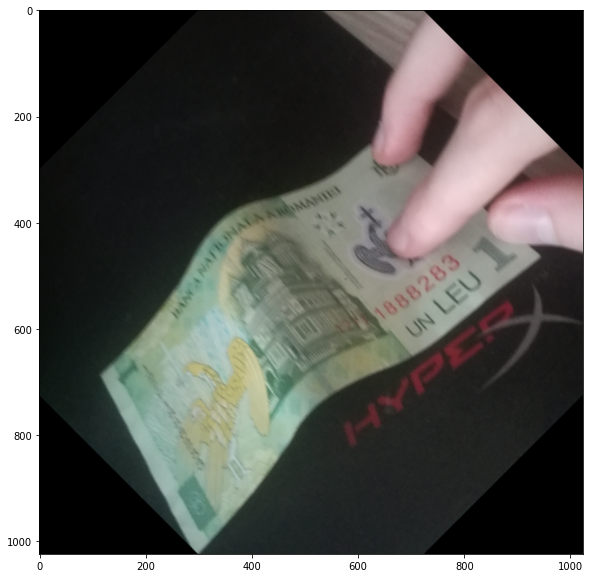

In [19]:
plt.figure(figsize=(10, 10))
plt.imshow(img_rot)
plt.show()

## Color modification

### Brightness, contrast

Contrast and brightness can be adjusted using the following formula: 
$$g(x) = \alpha \cdot f(x) + \beta$$
$$g(i,j)=\alpha \cdot f(i,j)+\beta$$
where 
- $\alpha$ = contrast
- $\beta$ = brightness
- $f(x)$ is a data point -> image pixel

In [22]:
np.full((2, 2), 23)

array([[23, 23],
       [23, 23]])

In [20]:
brightness_amount = np.full(img.shape, 70, dtype = np.uint8)
img_bright = cv2.add(img, brightness_amount)
img_not_bright = cv2.subtract(img, brightness_amount)

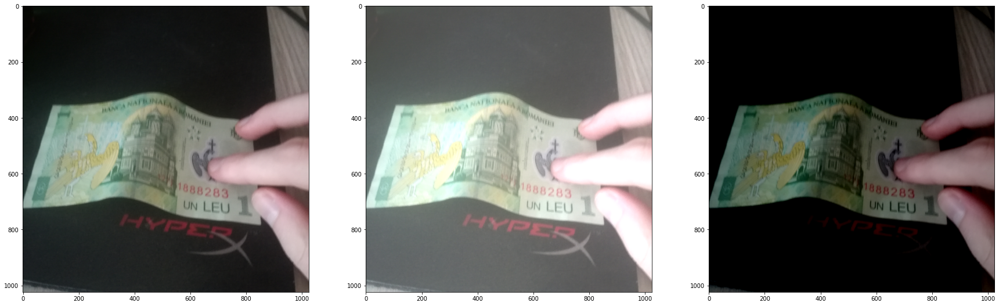

In [21]:
fig, axs = plt.subplots(1, 3, figsize = (30, 10))
axs[0].imshow(img)
axs[1].imshow(img_bright)
axs[2].imshow(img_not_bright)
plt.show()

In [24]:
?cv2.addWeighted

In [25]:
img_high_contrast = cv2.addWeighted(img, 1.5, img, 0, 0)
img_low_contrast = cv2.addWeighted(img, .5, img, 0, 0)

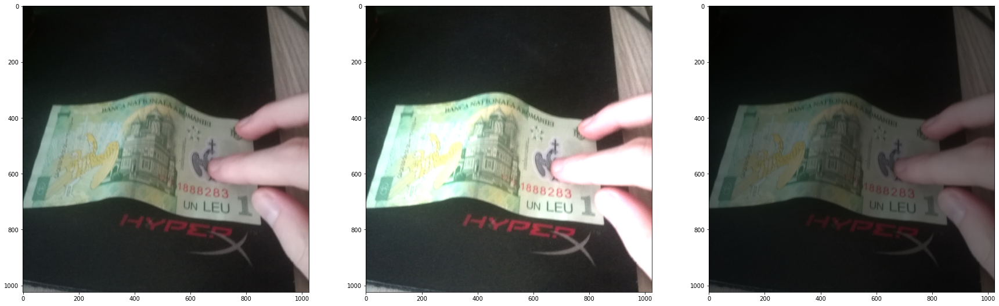

In [26]:
fig, axs = plt.subplots(1, 3, figsize = (30, 10))
axs[0].imshow(img)
axs[1].imshow(img_high_contrast)
axs[2].imshow(img_low_contrast)
plt.show()

## Sharpening, blurring

- https://docs.opencv.org/master/d4/d13/tutorial_py_filtering.html
- https://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_filtering/py_filtering.html#filtering
- https://en.wikipedia.org/wiki/Kernel_(image_processing)


In [117]:
# ?cv2.filter2D

In [183]:
#?cv2.GaussianBlur

In [27]:
kernel = np.array([[0, -1, 0],
                  [-1, 5, -1],
                  [0, -1, 0]])
img_sharp = cv2.filter2D(img, -1, kernel)


kernel = np.ones((10, 10), np.float32) / 100
img_blur = cv2.filter2D(img, -1, kernel)

img_gblur = cv2.GaussianBlur(img, (11, 11), 0)

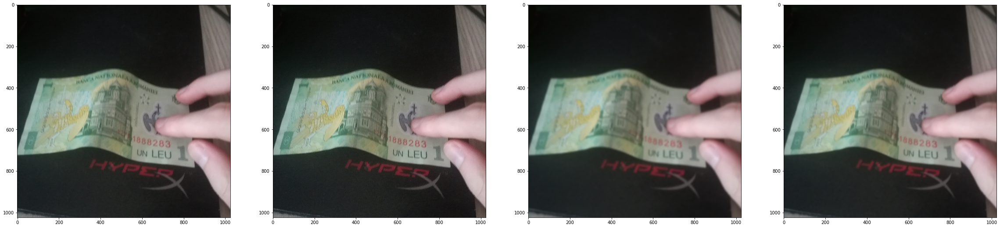

In [28]:
fig, axs = plt.subplots(1, 4, figsize = (40, 10))
axs[0].imshow(img)
axs[1].imshow(img_sharp)
axs[2].imshow(img_blur)
axs[3].imshow(img_gblur)
plt.show()


## Add noise

**Types of noise**
- Gaussian noise (0 -> 255 based on mean and std)
- Salt/pepper noise (0 or 255)

In [185]:
?np.random.normal

In [31]:
### Gaussian noise
mu = 0
std = .7
gnoise = np.random.normal(mu, std, img.shape).astype(np.uint8) # kinda iffy 

img_gnoise = cv2.add(img, gnoise)

### Salt Pepper noise 
probs = np.random.random((img.shape[0], img.shape[1]))
p = .1
img_spnoise = img.copy()
img_spnoise[probs < (p / 2)] = np.array([0, 0, 0], dtype = np.uint8) # Black
img_spnoise[probs >  (1 - (p / 2))] = np.array([255, 255, 255], dtype = np.uint8) # White

In [32]:
gnoise.shape

(1024, 1024, 3)

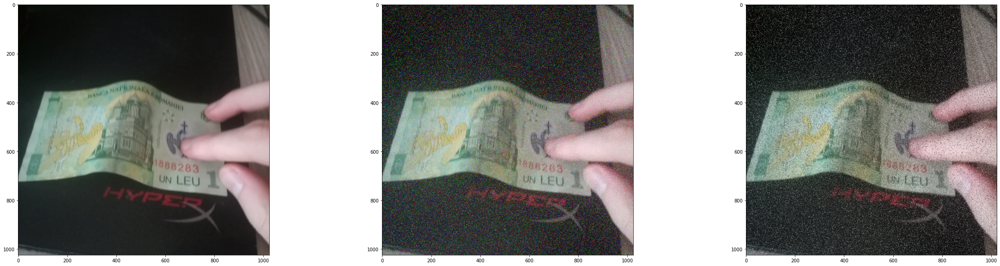

In [33]:
fig, axs = plt.subplots(1, 3, figsize = (40, 10))
axs[0].imshow(img)
axs[1].imshow(img_gnoise)
axs[2].imshow(img_spnoise)
plt.show()

# Image augumentation - imgaug

In [37]:
from imgaug import augmenters as iaa
import imgaug as ia

In [38]:
?iaa.Affine

In [39]:
effects = []

In [57]:
#Take some effects

# Flips, rotate
flip_horizontal = iaa.Fliplr(1) # % of images
flip_vertical = iaa.Flipud(1) # % of images
rotate = iaa.Affine(rotate = (-45, 45)) # Random between (-25, 25)

#Color
ch_shuffle = iaa.ChannelShuffle(1) # % of images to shuffle the channel
brightness = iaa.Add((-40, 40)) # Random between
contrast = iaa.Multiply((0.5, 1.5)) # Random between

# Noise
gnoise = iaa.AdditiveGaussianNoise(scale = (0, .4 * 255))
salt_pepper = iaa.SaltAndPepper(0.2) # % of pixels

#Cut 
cutout = iaa.Cutout(nb_iterations = 2) 

# Blur
gblur = iaa.GaussianBlur(sigma = (0., 6.))
avgblur = iaa.AverageBlur(k=(2, 11))

effects = [flip_horizontal, flip_vertical, rotate, ch_shuffle, brightness, contrast, gnoise, salt_pepper, cutout, gblur, avgblur]

In [60]:
type(contrast)

imgaug.augmenters.arithmetic.Multiply

In [41]:
images_aug = [img]
for effect in effects:
    img_aug = effect(image = img)
    images_aug.append(img_aug)
images_aug = np.array(images_aug)

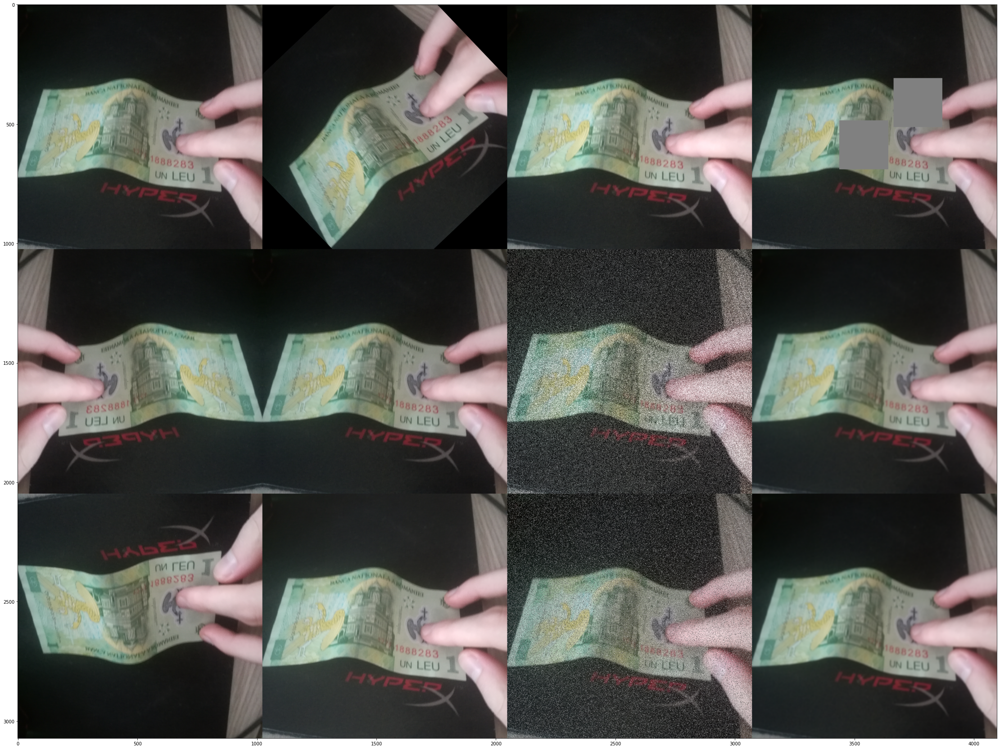

In [42]:
G1 = 3
G2 = 4
plt.figure(figsize = (40, 30))
plt.imshow(np.concatenate(images_aug.reshape(G2, 1024 * G1, 1024, 3), axis = 1))
plt.show()

## Their example

In [47]:
# Example batch of images.
# The array has shape (32, 64, 64, 3) and dtype uint8.
images = np.array(
    [ia.quokka(size=(64, 64)) for _ in range(32)],
    dtype=np.uint8
)

seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontal flips
    iaa.Crop(percent=(0, 0.1)), # random crops
    # Small gaussian blur with random sigma between 0 and 0.5.
    # But we only blur about 50% of all images.
    iaa.Sometimes(
        0.5,
        iaa.GaussianBlur(sigma=(0, 0.5))
    ),
    # Strengthen or weaken the contrast in each image.
    iaa.LinearContrast((0.75, 1.5)),
    # Add gaussian noise.
    # For 50% of all images, we sample the noise once per pixel.
    # For the other 50% of all images, we sample the noise per pixel AND
    # channel. This can change the color (not only brightness) of the
    # pixels.
    iaa.AdditiveGaussianNoise(loc=0, scale=(0.0, 0.05*255), per_channel=0.5),
    # Make some images brighter and some darker.
    # In 20% of all cases, we sample the multiplier once per channel,
    # which can end up changing the color of the images.
    iaa.Multiply((0.8, 1.2), per_channel=0.2),
    # Apply affine transformations to each image.
    # Scale/zoom them, translate/move them, rotate them and shear them.
    iaa.Affine(
        scale={"x": (0.80, 1.2), "y": (0.80, 1.2)},
        translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)},
        rotate=(-25, 25),
        shear=(-6, 6)
    )
], random_order=True) # apply augmenters in random order

images_aug = seq(images=images)

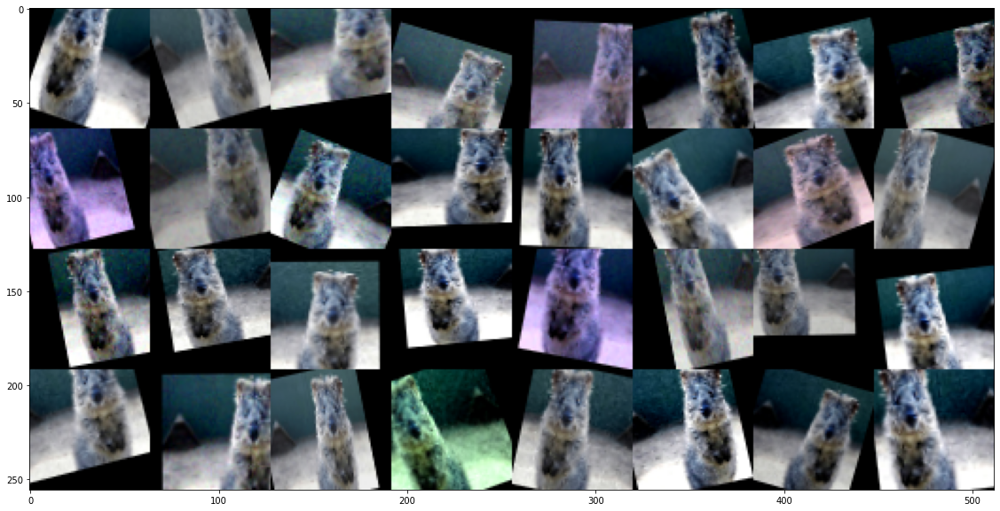

In [48]:
G1 = 4
G2 = 8
images_sel = images_aug[:G1 * G2]
plt.figure(figsize = (20, 10))
plt.imshow(np.concatenate(images_sel.reshape(G2, 64 * G1, 64, 3), axis = 1))
plt.show()

## Our dataset

In [49]:
imgs = load_images_from_folder(os.path.join('datasets', 'money', '1'))

In [50]:
imgs.shape

(15, 256, 256, 3)

In [55]:
imgs_aug = seq(images=imgs)

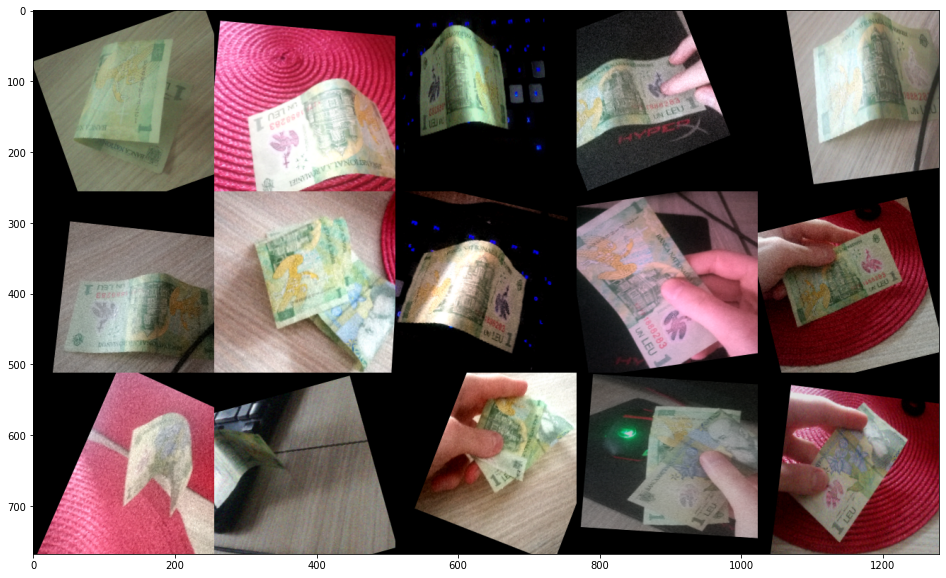

In [56]:
G1 = 3
G2 = 5
images_sel = imgs_aug[:G1 * G2]
plt.figure(figsize = (20, 10))
plt.imshow(np.concatenate(images_sel.reshape(G2, 256 * G1, 256, 3), axis = 1))
plt.show()

In [381]:
dir_aug = os.path.join('datasets/money/1_aug')
save_images_in_folder(folder=dir_aug, images=imgs_aug, size=(256, 256), start_index=0)

In [386]:
def augment_images(folder, augmenter, images, size = (256, 256), start_index = 0, iterations = 1):
    n = len(images)
    for i in range(iterations):
        images_augmented = augmenter(images=images)
        save_images_in_folder(folder = dir_aug, images = images_augmented, size = size, start_index = i * n)
    

In [394]:
imgs = load_images_from_folder(os.path.join('datasets', 'money', '1'))

In [395]:
dir_aug = os.path.join('datasets/money/1_aug')
augment_images(folder = dir_aug, augmenter = seq, images=imgs, size = (128, 128), start_index = 0, iterations = 100, )